# Cleaning US Census Data

You just got hired as a Data Analyst at the Census Bureau, which collects census data and creates interesting visualizations and insights from it.  

The person who had your job before you left you all the data they had for the most recent census. It is in multiple `csv` files. They didn't use pandas, they would just look through these `csv` files manually whenever they wanted to find something. Sometimes they would copy and paste certain numbers into Excel to make charts.  

The thought of it makes you shiver. This is not scalable or repeatable.  

Your boss wants you to make some scatterplots and histograms by the end of the day. Can you get this data into `pandas` and into reasonable shape so that you can make these histograms?  

__data files:__  
- states0.csv
- states1.csv
- states2.csv
- states3.csv
- states4.csv
- states5.csv
- states6.csv
- states7.csv
- states8.csv
- states9.csv

## Inspect the Data!

1. The first visualization your boss wants you to make is a scatterplot that shows average income in a state vs proportion of women in that state.

   Open some of the census `csv` files that came with the kit you downloaded. How are they named? What kind of information do they hold? Will they help us make this graph?

In [32]:
# import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import matplotlib.cm as cm

In [4]:
# task 1 - Open some of the census csv files
states0 = pd.read_csv('states0.csv')
states1 = pd.read_csv('states1.csv')
print("states0 dataset: ", states0.shape) # (6, 11)
print(states0.columns)
print(states0.dtypes)
print(states0.head())
print("states1 dataset: ", states1.shape) # (6, 11)
print(states1.columns)
print(states1.dtypes)
print(states1.head())

states0 dataset:  (6, 11)
Index(['Unnamed: 0', 'State', 'TotalPop', 'Hispanic', 'White', 'Black',
       'Native', 'Asian', 'Pacific', 'Income', 'GenderPop'],
      dtype='object')
Unnamed: 0     int64
State         object
TotalPop       int64
Hispanic      object
White         object
Black         object
Native        object
Asian         object
Pacific       object
Income        object
GenderPop     object
dtype: object
   Unnamed: 0       State  TotalPop Hispanic   White   Black  Native   Asian  \
0           0     Alabama   4830620    3.75%  61.88%  31.25%   0.45%   1.05%   
1           1      Alaska    733375    5.91%  60.91%   2.85%  16.39%   5.45%   
2           2     Arizona   6641928   29.57%  57.12%   3.85%   4.36%   2.88%   
3           3    Arkansas   2958208    6.22%  71.14%  18.97%   0.52%   1.14%   
4           4  California  38421464   37.29%  40.22%   5.68%   0.41%  13.05%   

  Pacific       Income            GenderPop  
0   0.03%  $43,296.36     2341093M_2489527F  
1

__Initial observations:__  
Variables are as follow:  
- Unnamed: 0     int64
- State         object
- TotalPop       int64
- Hispanic      object
- White         object
- Black         object
- Native        object
- Asian         object
- Pacific       object
- Income        object
- GenderPop     object

The files have the same dimensions and columns ('Unnamed: 0','State','TotalPop','Hispanic','White','Black','Native','Asian','Pacific','Income','GenderPop') in the same order so they can be concatenated.  
Several variables are numerical but contain non numerical characters (%, $) and therefore are interpreted as objects. They need to be transformed/parsed to be used for stats and data representation.
I don't know what the variable "Unnamed" corresponds to. Could be an index.
Headers "Hispanic", "White", etc... do not describe the data well. They should be melted in a "race" variable and the values into proportions. That's probably the 1st step.
The GenderPop contains both the gender and the number of person in each gender. This should be split into a gender and genderpop columns.

2. It will be easier to inspect this data once we have it in a DataFrame. You can't even call `.head()` on these `csv`s! How are you supposed to read them?

   Using `glob`, loop through the census files available and load them into DataFrames. Then, concatenate all of those DataFrames together into one DataFrame, called something like `us_census`.

In [6]:
# task 2 - Using glob, loop through the census files available and load them into DataFrames. 
import glob
state = glob.glob("states*.csv")
census = []
for filename in state:
  data = pd.read_csv(filename)
  census.append(data)
us_census = pd.concat(census)
print("us_census dataset: ", us_census.shape) # (60, 11)
print(us_census.columns)
print(us_census.dtypes)
print(us_census.head())

us_census dataset:  (60, 11)
Index(['Unnamed: 0', 'State', 'TotalPop', 'Hispanic', 'White', 'Black',
       'Native', 'Asian', 'Pacific', 'Income', 'GenderPop'],
      dtype='object')
Unnamed: 0     int64
State         object
TotalPop       int64
Hispanic      object
White         object
Black         object
Native        object
Asian         object
Pacific       object
Income        object
GenderPop     object
dtype: object
   Unnamed: 0       State  TotalPop Hispanic   White   Black  Native   Asian  \
0           0     Alabama   4830620    3.75%  61.88%  31.25%   0.45%   1.05%   
1           1      Alaska    733375    5.91%  60.91%   2.85%  16.39%   5.45%   
2           2     Arizona   6641928   29.57%  57.12%   3.85%   4.36%   2.88%   
3           3    Arkansas   2958208    6.22%  71.14%  18.97%   0.52%   1.14%   
4           4  California  38421464   37.29%  40.22%   5.68%   0.41%  13.05%   

  Pacific       Income            GenderPop  
0   0.03%  $43,296.36     2341093M_2489527F 

3. Look at the `.columns` and the `.dtypes` of the `us_census` DataFrame. Are those datatypes going to hinder you as you try to make histograms?

In [11]:
# see task 1

4. Look at the `head()` of the DataFrame so that you can understand why some of these `dtypes` are objects instead of integers or floats.

   Start to make a plan for how to convert these columns into the right types for manipulation.

In [13]:
# see task 1

## Regex to the Rescue

5. Use regex to turn the `Income` column into a format that is ready for conversion into a numerical type.

In [8]:
# task 5 - Use regex to turn the Income column into a format that is ready for conversion into a numerical type
us_census.Income = us_census.Income.replace('[\$,]', '', regex=True)
us_census.Income = pd.to_numeric(us_census.Income)
print(us_census.Income.head())

0    43296.36
1    70354.74
2    54207.82
3    41935.63
4    67264.78
Name: Income, dtype: float64


6. Look at the `GenderPop` column. We are going to want to separate this into two columns, the `Men` column, and the `Women` column.

   Split the column into those two new columns using `str.split` and separating out those results.

In [10]:
# task 6 - Split the GenderPop column into those two new columns using str.split and separating out those results
print(us_census.GenderPop.head())
GenderPop_split = us_census.GenderPop.str.split('_')
us_census['Male'] = GenderPop_split.str.get(0)
us_census['Female'] = GenderPop_split.str.get(1)
# Drop unecessary GenderPop column
us_census.drop(['GenderPop'], axis=1) # didn't work. why?
print(us_census.head())

0      2341093M_2489527F
1        384160M_349215F
2      3299088M_3342840F
3      1451913M_1506295F
4    19087135M_19334329F
Name: GenderPop, dtype: object
   Unnamed: 0       State  TotalPop Hispanic   White   Black  Native   Asian  \
0           0     Alabama   4830620    3.75%  61.88%  31.25%   0.45%   1.05%   
1           1      Alaska    733375    5.91%  60.91%   2.85%  16.39%   5.45%   
2           2     Arizona   6641928   29.57%  57.12%   3.85%   4.36%   2.88%   
3           3    Arkansas   2958208    6.22%  71.14%  18.97%   0.52%   1.14%   
4           4  California  38421464   37.29%  40.22%   5.68%   0.41%  13.05%   

  Pacific    Income            GenderPop       Male     Female  
0   0.03%  43296.36    2341093M_2489527F   2341093M   2489527F  
1   1.06%  70354.74      384160M_349215F    384160M    349215F  
2   0.17%  54207.82    3299088M_3342840F   3299088M   3342840F  
3   0.15%  41935.63    1451913M_1506295F   1451913M   1506295F  
4   0.35%  67264.78  19087135M_1933432

7. Convert both of the columns into numerical datatypes.

   There is still an `M` or an `F` character in each entry! We should remove those before we convert.

In [12]:
# task 7 - Remove non-numerical characters and convert both of the columns into numerical datatypes
us_census['Male'] = us_census['Male'].replace('[^\d]', '', regex=True)
us_census['Female'] = us_census['Female'].replace('[^\d]', '', regex=True)
us_census['Male'] = pd.to_numeric(us_census['Male'], downcast='integer')
us_census['Female'] = pd.to_numeric(us_census['Female'], downcast='integer')
print(us_census.head())
print(us_census.dtypes)
print(us_census.describe())

   Unnamed: 0       State  TotalPop Hispanic   White   Black  Native   Asian  \
0           0     Alabama   4830620    3.75%  61.88%  31.25%   0.45%   1.05%   
1           1      Alaska    733375    5.91%  60.91%   2.85%  16.39%   5.45%   
2           2     Arizona   6641928   29.57%  57.12%   3.85%   4.36%   2.88%   
3           3    Arkansas   2958208    6.22%  71.14%  18.97%   0.52%   1.14%   
4           4  California  38421464   37.29%  40.22%   5.68%   0.41%  13.05%   

  Pacific    Income            GenderPop      Male      Female  
0   0.03%  43296.36    2341093M_2489527F   2341093   2489527.0  
1   1.06%  70354.74      384160M_349215F    384160    349215.0  
2   0.17%  54207.82    3299088M_3342840F   3299088   3342840.0  
3   0.15%  41935.63    1451913M_1506295F   1451913   1506295.0  
4   0.35%  67264.78  19087135M_19334329F  19087135  19334329.0  
Unnamed: 0      int64
State          object
TotalPop        int64
Hispanic       object
White          object
Black          obje

8. Now you should have the columns you need to make the graph and make sure your boss does not slam a ruler angrily on your desk because you've wasted your whole day cleaning your data with no results to show!

   Use matplotlib to make a scatterplot!
   
   ```py
   plt.scatter(the_women_column, the_income_column)
   ```
   
   Remember to call `plt.show()` to see the graph!

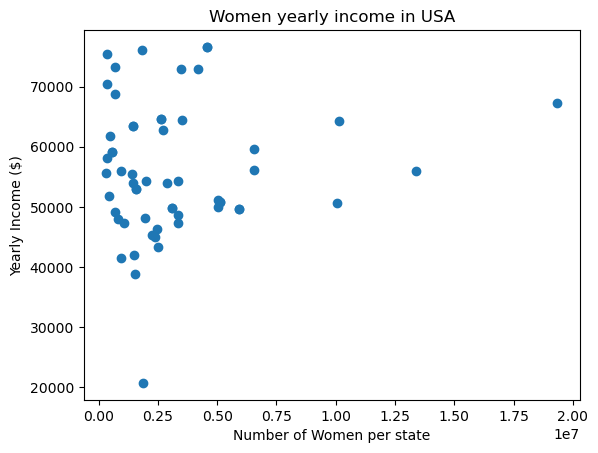

In [14]:
# task 8 - plot female income
plt.scatter(data=us_census, x='Female', y='Income')
plt.title('Women yearly income in USA')
plt.xlabel('Number of Women per state')
plt.ylabel('Yearly Income ($)')
plt.show()

9. You want to double check your work. You know from experience that these monstrous csv files probably have `nan` values in them! Print out your column with the number of women per state to see.

   We can fill in those `nan`s by using pandas' `.fillna()` function.
   
   You have the `TotalPop` per state, and you have the `Men` per state. As an estimate for the `nan` values in the `Women` column, you could use the `TotalPop` of that state minus the `Men` for that state.
   
   Print out the `Women` column after filling the `nan` values to see if it worked!

In [16]:
# task 9 - Print out your column with the number of women per state 
#print(us_census.Female) # there are nome NaN
#  fill in those nans by using pandas' .fillna() function
us_census.Female = us_census.Female.fillna(us_census.TotalPop - us_census.Male)
print(us_census.Female)

0     2489527.0
1      349215.0
2     3342840.0
3     1506295.0
4    19334329.0
5     2630239.0
0     2630239.0
1     1841615.0
2      478041.0
3      340810.0
4    10045763.0
5     5123362.0
0     5123362.0
1      696428.0
2      806083.0
3     6556862.0
4     3333382.0
5     1558931.0
0     1558931.0
1     1453125.0
2     2233145.0
3     2364097.0
4      679019.0
5     3057895.0
0     3057895.0
1     3455936.0
2     5038598.0
3     2727005.0
4     1536358.0
5     3081445.0
0     3081445.0
1      504536.0
2      939759.0
3     1390901.0
4      670717.0
5     4561386.0
0     4561386.0
1     1051703.0
2    10131373.0
3     5049925.0
4      353677.0
5     5913084.0
0     5913084.0
1     1942789.0
2     1990780.0
3     6534215.0
4     1869213.0
5      543273.0
0      543273.0
1     2455167.0
2      419713.0
3     3331859.0
4    13367298.0
5     1444150.0
0     1444150.0
1      318031.0
2     4195682.0
3     3497739.0
4      937789.0
5     2890732.0
Name: Female, dtype: float64


10. We forgot to check for duplicates! Use `.duplicated()` on your `census` DataFrame to see if we have duplicate rows in there.

In [18]:
# task 10 - check for duplicates from columns State onward (column Unnamed is to be disregraded)
duplicates = us_census.duplicated(subset=us_census.columns[1:])
print(duplicates.value_counts()) # 9 duplicates
print(duplicates)
#print(us_census)

False    51
True      9
Name: count, dtype: int64
0    False
1    False
2    False
3    False
4    False
5    False
0     True
1    False
2    False
3    False
4    False
5    False
0     True
1    False
2    False
3    False
4    False
5    False
0     True
1    False
2    False
3    False
4    False
5    False
0     True
1    False
2    False
3    False
4    False
5    False
0     True
1    False
2    False
3    False
4    False
5    False
0     True
1    False
2    False
3    False
4    False
5    False
0     True
1    False
2    False
3    False
4    False
5    False
0     True
1    False
2    False
3    False
4    False
5    False
0     True
1    False
2    False
3    False
4    False
5    False
dtype: bool


11. Drop those duplicates using the `.drop_duplicates()` function.

In [20]:
# task 11 - eliminate the duplicates
us_census = us_census.drop_duplicates(subset=us_census.columns[1:])
print(us_census.shape) # (51, 13)

(51, 13)


12. Make the scatterplot again. Now, it should be perfect! Your job is secure, for now.

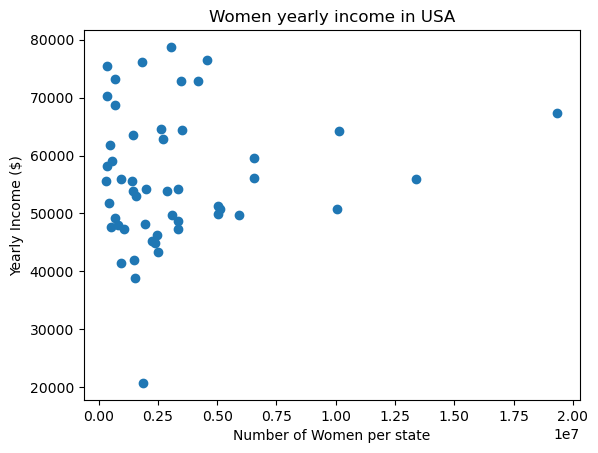

In [22]:
# task 12 - replot female income
plt.scatter(data=us_census, x='Female', y='Income')
plt.title('Women yearly income in USA')
plt.xlabel('Number of Women per state')
plt.ylabel('Yearly Income ($)')
plt.show()

## Histogram of Races

13. Now your boss wants you to make a bunch of histograms out of the race data that you have. Look at the `.columns` again to see what the race categories are.

In [24]:
# task 13 - Look at the .columns again to see what the race categories are.
print(us_census.columns) 
# race variables are: 'Hispanic', 'White', 'Black', 'Native', 'Asian', 'Pacific'

Index(['Unnamed: 0', 'State', 'TotalPop', 'Hispanic', 'White', 'Black',
       'Native', 'Asian', 'Pacific', 'Income', 'GenderPop', 'Male', 'Female'],
      dtype='object')


14. Try to make a histogram for each one!

    You will have to get the columns into the numerical format, and those percentage signs will have to go.
    
    Don't forget to fill the `nan` values with something that makes sense! You probably dropped the duplicate rows when making your last graph, but it couldn't hurt to check for duplicates again.

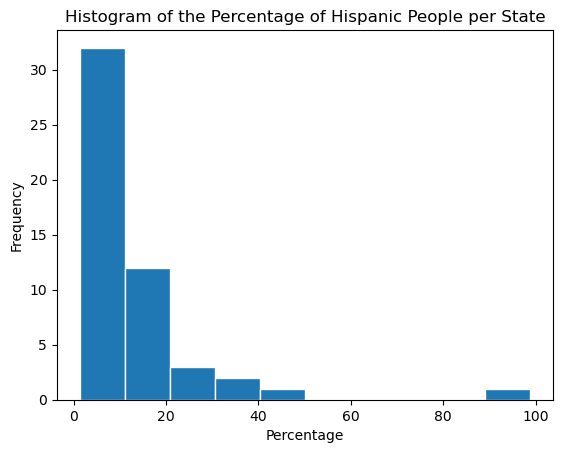

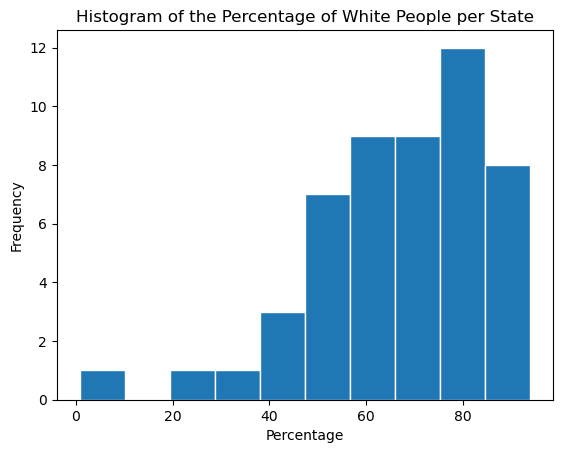

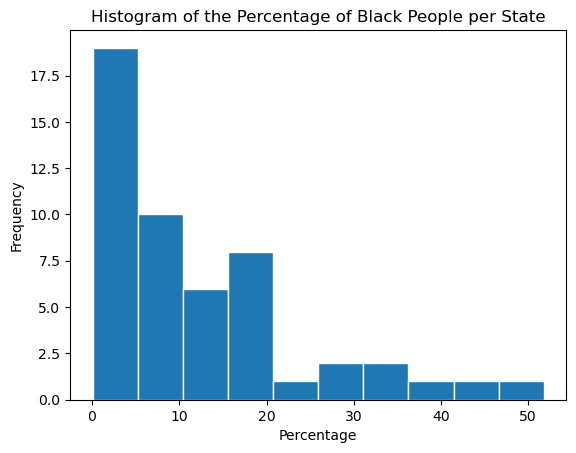

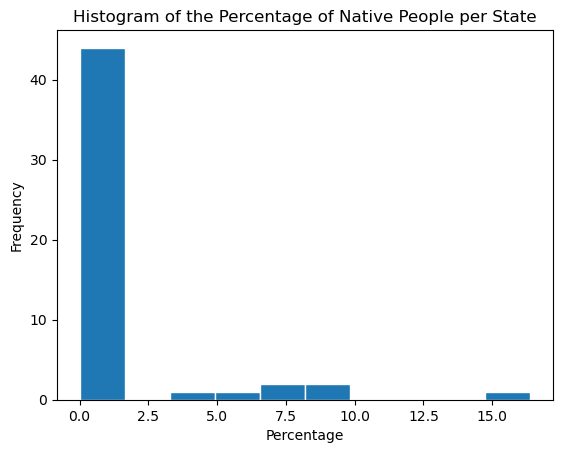

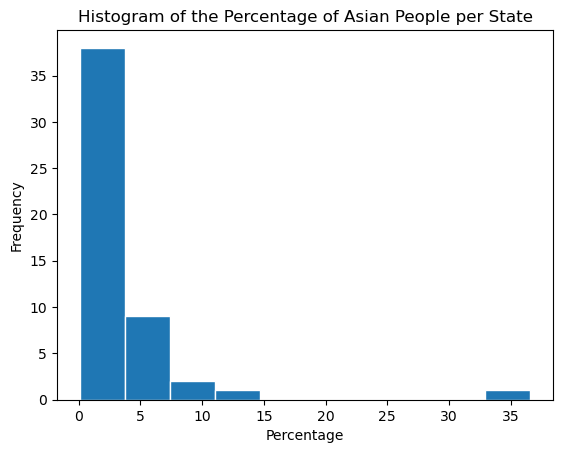

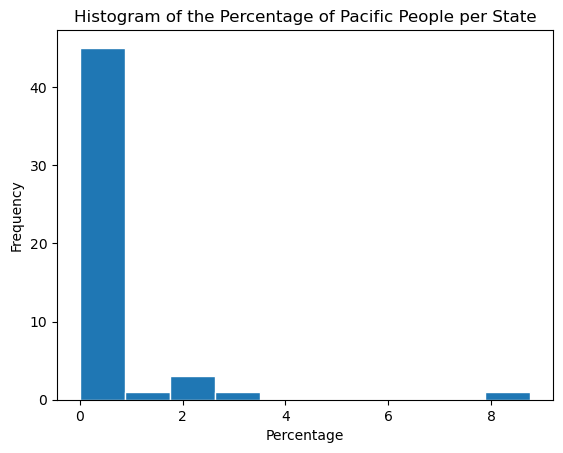

<Figure size 640x480 with 0 Axes>

In [26]:
# task 14 - convert the race variables to numerical by using regex to eliminate the % sign
for race in ['Hispanic', 'White', 'Black', 'Native', 'Asian', 'Pacific']:
    for index in range(0,len(us_census)):    
        string = str(us_census[race].iat[index])
        replace = string.replace('%', '')
        if (replace == "nan"):
            replace = ""
        us_census[race].iat[index] = replace
    us_census[race] = pd.to_numeric(us_census[race])
#print(us_census)

# fill the nan values with something that makes sense
# where are the Nan?
us_census.isna().value_counts() # there are 4 NaN in 'Pacific'
# we could subtract the population of all other races to 100% to compute pacific proportion
us_census.Pacific = us_census.Pacific.fillna(100 - (us_census.Hispanic + us_census.White + us_census.Black + us_census.Native + us_census.Asian))
#print(us_census)

# check for duplicates
us_census = us_census.drop_duplicates(subset=us_census.columns[1:])
#print(us_census.shape) # (51, 13)

# plot each race acros all states
for race in ['Hispanic', 'White', 'Black', 'Native', 'Asian', 'Pacific']:
    plt.hist(us_census[race], edgecolor='white')
    plt.title("Histogram of the Percentage of {} People per State".format(race))
    plt.xlabel("Percentage")
    plt.ylabel("Frequency")
    plt.show()
    plt.clf()

## Get Creative

15. Phew. You've definitely impressed your boss on your first day of work.

    But is there a way you really convey the power of pandas and Python over the drudgery of `csv` and Excel?
    
    Try to make some more interesting graphs to show your boss, and the world! You may need to clean the data even more to do it, or the cleaning you have already done may give you the ease of manipulation you've been searching for.

Index(['Unnamed: 0', 'State', 'TotalPop', 'Hispanic', 'White', 'Black',
       'Native', 'Asian', 'Pacific', 'Income', 'GenderPop', 'Male', 'Female'],
      dtype='object')
        State  TotalPop    Income            GenderPop      Male      Female  \
0     Alabama   4830620  43296.36    2341093M_2489527F   2341093   2489527.0   
1      Alaska    733375  70354.74      384160M_349215F    384160    349215.0   
2     Arizona   6641928  54207.82    3299088M_3342840F   3299088   3342840.0   
3    Arkansas   2958208  41935.63    1451913M_1506295F   1451913   1506295.0   
4  California  38421464  67264.78  19087135M_19334329F  19087135  19334329.0   

       Race  Proportion  
0  Hispanic        3.75  
1  Hispanic        5.91  
2  Hispanic       29.57  
3  Hispanic        6.22  
4  Hispanic       37.29  


C:\ProgramData\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
C:\Users\Owner\AppData\Local\Temp\ipykernel_11048\57971311.py:17: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


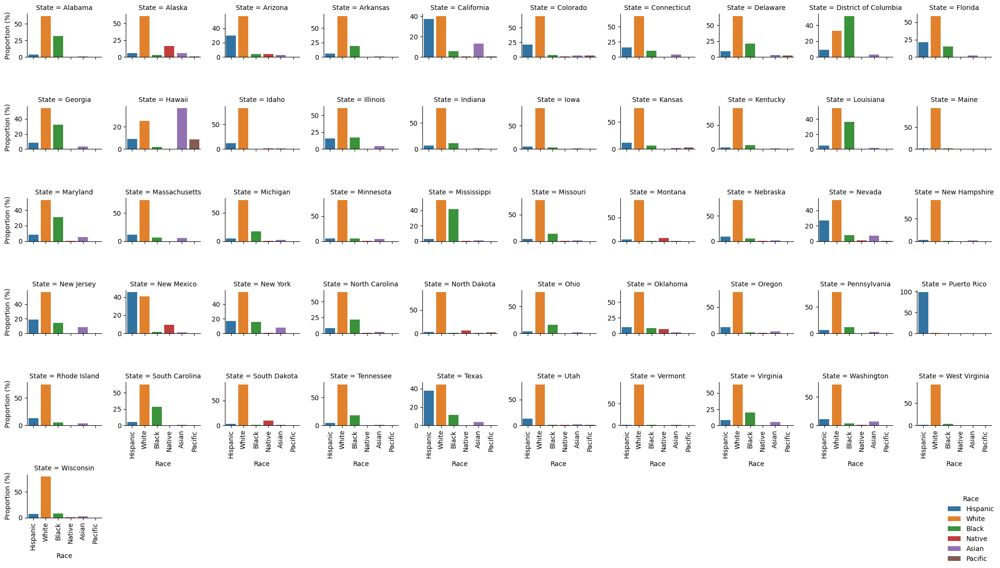

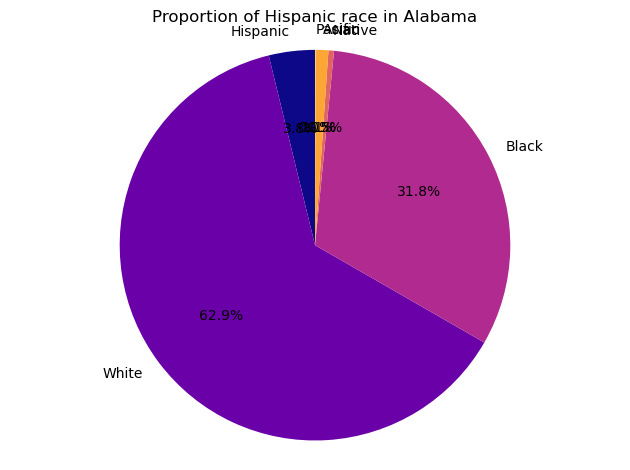

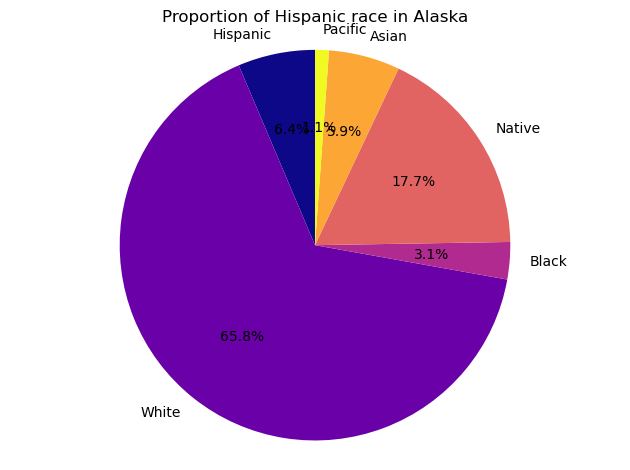

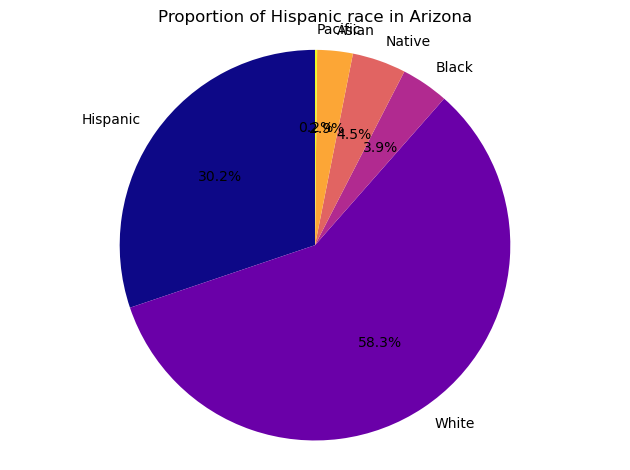

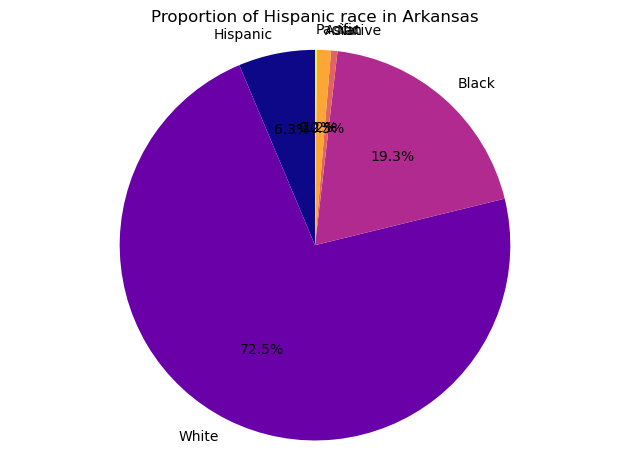

...

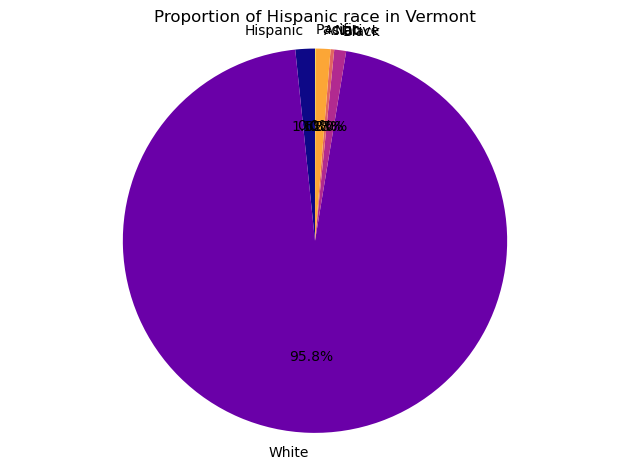

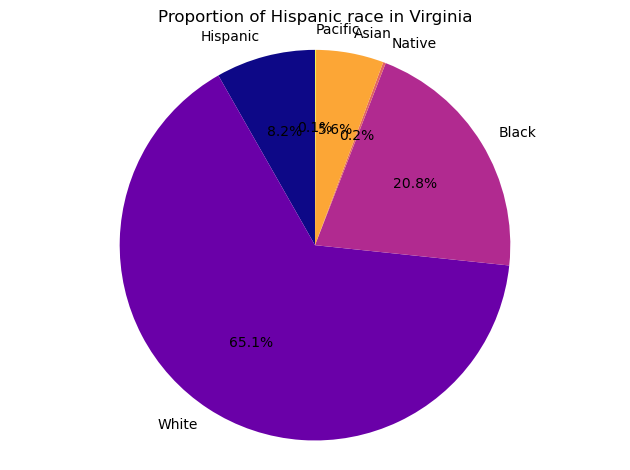

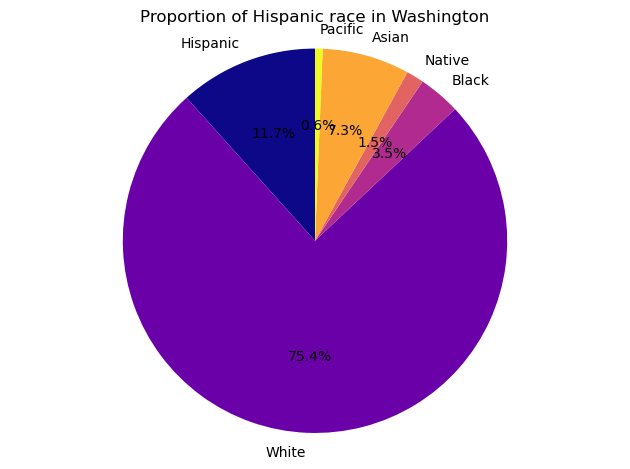

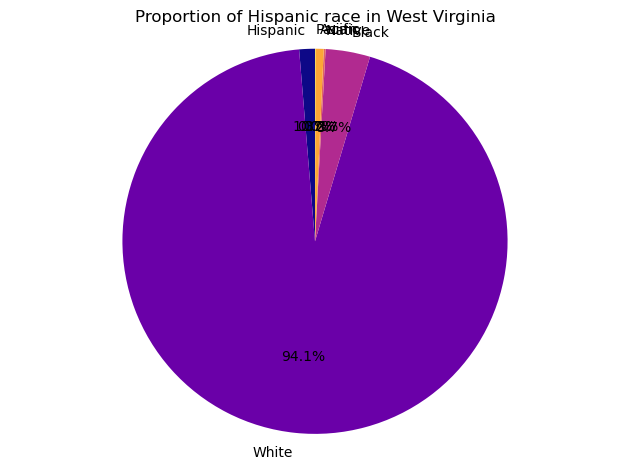

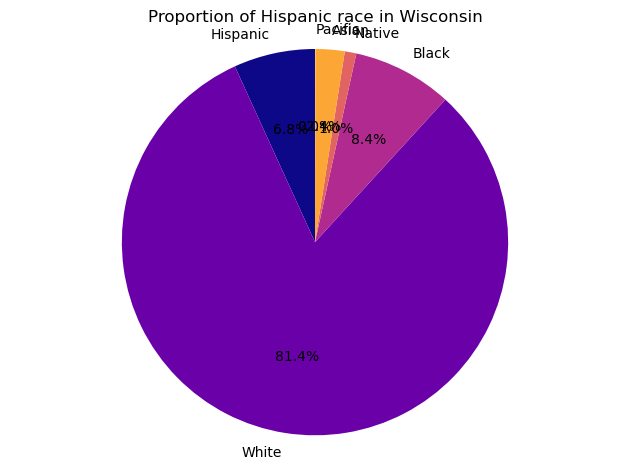

<Figure size 640x480 with 0 Axes>

In [34]:
## Task 15 - EDA and data visualisation
# Bar or pie charts would suit population proportions. With some many states, a loop or FacetGrid is required.
# for this I need to melt the races
print(us_census.columns)
us_census2 = pd.melt(frame=us_census, id_vars=['State', 'TotalPop','Income', 'GenderPop', 'Male', 'Female'], value_vars=['Hispanic', 'White', 'Black', 'Native', 'Asian', 'Pacific'], value_name="Proportion", var_name="Race")
print(us_census2.head())

# Barplot of races across all states in a single FacetGrid figure
# Initialize a grid of plots with an Axes for each state
grid_race = sns.FacetGrid(us_census2, col="State", hue='Race',col_wrap=10, height=2, aspect=1, sharey=False)
# Map the barplot to the grid
grid_race.map(sns.barplot, "Race", "Proportion", order=['Hispanic', 'White', 'Black', 'Native', 'Asian', 'Pacific']).add_legend(loc='lower right').set_axis_labels("Race", "Proportion (%)")
# Adjust the tick positions and labels
for ax in grid_race.axes.flatten():
    ax.set_xticklabels(['Hispanic', 'White', 'Black', 'Native', 'Asian', 'Pacific'], rotation=90)
# Use tight_layout manually to adjust the layout
plt.tight_layout()
# Suppress the specific UserWarning
with warnings.catch_warnings():
    warnings.simplefilter("ignore", category=UserWarning)
    plt.tight_layout()
# Display the plot
plt.show()
# Clear the figure
plt.clf()

# Pie charts plotted via a loop
# Define colors for consistency across all states
num_wedges = len(us_census2['Race'].unique())
colors = cm.plasma(np.linspace(0, 1, num_wedges))

# Plot race proportions as pie charts for all states
for state in us_census2['State']:
    state_data = us_census2[us_census2['State'] == state]
    wedge_sizes = state_data['Proportion']
    pie_labels = state_data['Race']
    # pie plots
    plt.pie(wedge_sizes, labels=pie_labels, autopct='%0.1f%%', startangle=90, colors=colors)
    plt.axis('equal')
    plt.title("Proportion of {} race in {}".format(state_data['Race'].values[0], state))
    plt.tight_layout()
    plt.show()
    plt.clf()

Index(['State', 'TotalPop', 'Income', 'GenderPop', 'Male', 'Female', 'Race',
       'Proportion'],
      dtype='object')
        State  TotalPop    Income      Race  Proportion Gender   PopGender
0     Alabama   4830620  43296.36  Hispanic        3.75   Male   2341093.0
1      Alaska    733375  70354.74  Hispanic        5.91   Male    384160.0
2     Arizona   6641928  54207.82  Hispanic       29.57   Male   3299088.0
3    Arkansas   2958208  41935.63  Hispanic        6.22   Male   1451913.0
4  California  38421464  67264.78  Hispanic       37.29   Male  19087135.0


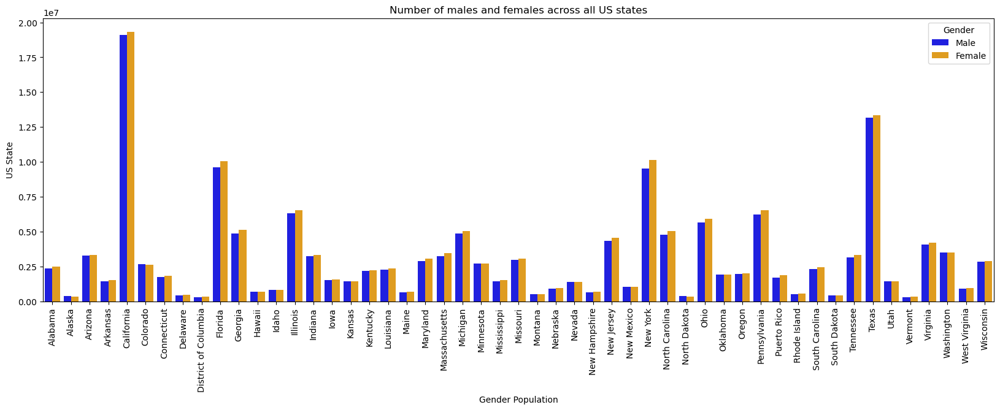

<Figure size 640x480 with 0 Axes>

In [40]:
# bar charts would suit to plot gender.
# for this I need to melt the genders
print(us_census2.columns)
us_census3 = pd.melt(frame=us_census2, id_vars=['State', 'TotalPop','Income', 'Race', 'Proportion'], value_vars=['Male', 'Female'], value_name="PopGender", var_name="Gender")
print(us_census3.head())

# Plot genders
plt.figure(figsize=(20,6))
sns.barplot(us_census3, x="State", y="PopGender", hue='Gender', palette=['blue','orange'])
plt.xlabel('Gender Population')
plt.ylabel('US State')
plt.title('Number of males and females across all US states')
# Get the current axis
ax = plt.gca()
# Set x-tick labels rotation
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.show()  
plt.clf()